# Notebook: Search Engine with Python, NLTK, and Scikit-learn
# Author: [Yasser Barghouth]

## Initialization and Imports

In [1]:
import ir_datasets
import ir_measures
import string
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet
from nltk import pos_tag
from spellchecker import SpellChecker
import mwparserfromhell
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np
import joblib
import re
import os
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud

from flask import Flask, request, jsonify
from flask_sqlalchemy import SQLAlchemy
from sqlalchemy import inspect

# Initialize SQLAlchemy instance
db = SQLAlchemy()

# Display imports
print("Imports completed.")

Imports completed.


## Preprocessor Class: Tokenization, stopword removal, lemmatization

In [2]:
class Preprocessor:
    def __init__(self):
        self.stop_words = set(stopwords.words('english'))
        self.lemmatizer = WordNetLemmatizer()

    def get_wordnet_pos(self, tag):
        tag_dict = {
            "J": wordnet.ADJ,
            "N": wordnet.NOUN,
            "V": wordnet.VERB,
            "R": wordnet.ADV
        }
        return tag_dict.get(tag[0].upper(), wordnet.NOUN)

    def lemmatization(self, tagged_doc_text):
        return [self.lemmatizer.lemmatize(word, pos=self.get_wordnet_pos(tag)) for word, tag in tagged_doc_text]
    
    def preprocess(self, text):
        tokens = word_tokenize(text.lower())
        tokens = [token.translate(str.maketrans(string.punctuation, ' ' * len(string.punctuation))) for token in tokens]
        tokens = [subtoken for token in tokens for subtoken in token.split()]
        tokens = [token for token in tokens if token.strip() and len(token) > 1]        
        tokens = [word for word in tokens if word not in self.stop_words]
        tagged_tokens = pos_tag(tokens)
        tokens = self.lemmatization(tagged_tokens)
        return tokens

In [4]:
# Initialize Preprocessor
preprocessor = Preprocessor()
print("Preprocessor initialized.")

# Example preprocessing
example_text = "The quick brown fox jumps over the lazy dog."
preprocessed_text = preprocessor.preprocess(example_text)
print("Example preprocessed text:", preprocessed_text)

Preprocessor initialized.
Example preprocessed text: ['quick', 'brown', 'fox', 'jump', 'lazy', 'dog']


## SpellCorrector Class: Corrects misspelled words in a query

In [3]:
class SpellCorrector:
    def __init__(self):
        self.spell_checker = SpellChecker()

    def correct_sentence_spelling(self, query):
        query_tokens = word_tokenize(query.lower())
        misspelled = self.spell_checker.unknown(query_tokens)
        # corrected_tokens = [self.spell_checker.correction(token) if token in misspelled else token for token in query_tokens]
        # return ' '.join(corrected_tokens)
        corrected_tokens = []
        for token in query_tokens:
            if token in misspelled:
                corrected_token = self.spell_checker.correction(token)
                if corrected_token is None:
                    print(f"Token '{token}' has no correction. Using the original token.")
                    corrected_token = token  # Default to the original token if no correction is found
            else:
                corrected_token = token
            corrected_tokens.append(corrected_token)
        
        return ' '.join(corrected_tokens)

In [6]:
# Initialize SpellCorrector
spell_corrector = SpellCorrector()
print("SpellCorrector initialized.")

# Example spell correction
example_query = "Th quik brown fox jmps ovver the lazi dog."
corrected_query = spell_corrector.correct_sentence_spelling(example_query)
print("Example corrected query:", corrected_query)

SpellCorrector initialized.
Example corrected query: the quit brown fox jumps over the lazy dog .


## Vectorizer Class: TF-IDF Vectorization

In [4]:
class Vectorizer:
    def __init__(self):
        self.vectorizer = TfidfVectorizer()

    def fit_transform(self, documents):
        self.tfidf_matrix = self.vectorizer.fit_transform(documents)
        return self.tfidf_matrix

    def transform(self, document):
        return self.vectorizer.transform([document])


In [8]:
# Initialize Vectorizer
vectorizer = Vectorizer()
print("Vectorizer initialized.")

# Example vectorization
documents = ["The quick brown fox.", "The lazy dog."]
tfidf_matrix = vectorizer.fit_transform(documents)
print("TF-IDF matrix shape:", tfidf_matrix.shape)

vector = vectorizer.transform(documents[0])
print("TF-IDF vector shape:", vector.shape)

Vectorizer initialized.
TF-IDF matrix shape: (2, 6)
TF-IDF vector shape: (1, 6)


In [9]:
# numbers of terms in documents
print(f"numbers of terms in documents: {len(vectorizer.vectorizer.vocabulary_)}") 

numbers of terms in documents: 6


In [10]:
# view table matrix tf-idf columns terms and rows index documents
df = pd.DataFrame(tfidf_matrix.toarray(), columns=vectorizer.vectorizer.get_feature_names_out())
df

,brown,dog,fox,lazy,quick,the
0,0.534046,0.000000,0.534046,0.000000,0.534046,0.379978
1,0.000000,0.631667,0.000000,0.631667,0.000000,0.449436


## Database Model for datasets

### TrecTot model

In [5]:
class TrecTotDocument(db.Model):
    id = db.Column(db.Integer, primary_key=True)
    doc_id = db.Column(db.Integer)
    page_title = db.Column(db.String(255))
    wikidata_classes = db.Column(db.String(255))
    text = db.Column(db.Text)
    sections = db.Column(db.Text)
    infoboxes = db.Column(db.Text)

    def to_dict(self):
        return {
            'id': self.id,
            'doc_id' : self.doc_id,
            'page_title': self.page_title,
            'wikidata_classes': self.wikidata_classes,
            'text': self.text,
            'sections': self.sections,
            'infoboxes': self.infoboxes,
        }
        
    def get_columns(self, exclude_id):
        columns = self.__table__.columns
        if exclude_id:
            return [column.name for column in columns if column.name != 'id']
        else:
            return [column.name for column in columns]

### WebisTouche model

In [6]:
class WebisToucheDocument(db.Model):
    id = db.Column(db.Integer, primary_key=True)
    doc_id = db.Column(db.String(255))
    title = db.Column(db.String(255))
    text = db.Column(db.Text)

    def to_dict(self):
        return {
            'id': self.id,
            'doc_id' : self.doc_id,
            'title': self.title,
            'text': self.text,
        }
        
    def get_columns(self, exclude_id):
        columns = self.__table__.columns
        if exclude_id:
            return [column.name for column in columns if column.name != 'id']
        else:
            return [column.name for column in columns]

### DocumentService class: Interacts with the database to manage documents

In [8]:
class DocumentService:
    def __init__(self, db):
        self.db = db
        
    def save_document(self, doc_data, dataset_name):
        if dataset_name == "trec-tot":
            doc = TrecTotDocument(
                doc_id=doc_data['doc_id'],
                page_title=doc_data['page_title'],
                wikidata_classes=doc_data['wikidata_classes'],
                text=doc_data['text'],
                sections=doc_data['sections'],
                infoboxes=doc_data['infoboxes']
            )
        elif dataset_name == "webis-touche":
            doc = WebisToucheDocument(
                doc_id=doc_data['doc_id'],
                title=doc_data['title'],
                text=doc_data['text']
            )
        self.db.session.add(doc)
        self.db.session.commit()

    def get_documents(self, dataset_name):
        try:
            if dataset_name == 'trec-tot':
                documents = TrecTotDocument.query.all()
            elif dataset_name == 'webis-touche':
                documents = WebisToucheDocument.query.all()
            else:
                documents = []
            return [doc.to_dict() for doc in documents]
        except Exception as e:
            print("Error occurred while fetching documents :", e)

    def check_data_exists(self, dataset_name):
        table = self.db.metadata.tables.get(dataset_name)
        if table is not None:
            count = self.db.session.query(table).count()
            return count > 0
        
    def check_table_exists(self, dataset_name):
        inspector = inspect(self.db.engine)
        return dataset_name in inspector.get_table_names()
    
    def get_columns(self, dataset_name):
        try:
            if dataset_name == 'trec-tot':
                return TrecTotDocument().get_columns(True)
            elif dataset_name == 'webis-touche':
                return WebisToucheDocument().get_columns(True)
            else:
                return []
        except Exception as e:
            print("Error occurred while fetching document columns:", e)
            
    def get_document_count(self, dataset_name):
        try:
            if dataset_name == 'trec-tot':
                return TrecTotDocument.query.count()
            elif dataset_name == 'webis-touche':
                return WebisToucheDocument.query.count()
            else:
                return 0
        except Exception as e:
            print("Error occurred while fetching document count:", e)
            
    def get_documents_by_indices(self, indices, dataset_name):
        if dataset_name == "trec-tot":
            documents =  TrecTotDocument.query.filter(TrecTotDocument.id.in_(indices)).all()
        elif dataset_name == "webis-touche":
            documents =  WebisToucheDocument.query.filter(WebisToucheDocument.id.in_(indices)).all()
        else:
            documents = []
        return [doc.to_dict() for doc in documents]

In [67]:
# Initialize DocumentService & Models classes

# Initialize Flask app
app = Flask(__name__)

# Configure SQLAlchemy database URI
app.config['SQLALCHEMY_DATABASE_URI'] = 'mysql://root:@localhost/ir_search_engine'
app.config['SQLALCHEMY_TRACK_MODIFICATIONS'] = False
db.init_app(app)

with app.app_context():
    db.create_all()
    
# Initialize DocumentService
document_service = DocumentService(db)

In [27]:
# Add example documents to the database
with app.app_context():
    # Add example TrecTotDocument
    example_doc1 = TrecTotDocument(
        doc_id=21231,
        page_title="Example Page Title",
        wikidata_classes="Q1,Q2,Q3",
        text="This is an example text.",
        sections="Section 1, Section 2",
        infoboxes="Infobox content"
    )
    db.session.add(example_doc1)
    
    # Add example WebisToucheDocument
    example_doc2 = WebisToucheDocument(
        doc_id=1231,
        title="Example Title",
        text="This is an example text for Webis-Touche."
    )
    db.session.add(example_doc2)
    
    db.session.commit()

In [28]:
# Fetch and print documents from the database
# Example usage of get_documents
with app.app_context():
    trec_docs = document_service.get_documents('trec-tot')
    webis_docs = document_service.get_documents('webis-touche')
    
    print("TrecTotDocument Examples:")
    for doc in trec_docs[:2]:
        print(doc)
    
    print("\nWebisToucheDocument Examples:")
    for doc in webis_docs[:2]:
        print(doc)

TrecTotDocument Examples:
{'id': 1, 'doc_id': 21231, 'page_title': 'Example Page Title', 'wikidata_classes': 'Q1,Q2,Q3', 'text': 'This is an example text.', 'sections': 'Section 1, Section 2', 'infoboxes': 'Infobox content'}

WebisToucheDocument Examples:
{'id': 1, 'doc_id': '1231', 'title': 'Example Title', 'text': 'This is an example text for Webis-Touche.'}


In [29]:
# Example usage of get_columns
with app.app_context():
    trec_columns = document_service.get_columns('trec-tot',)
    webis_columns = document_service.get_columns('webis-touche')
    
    print("TrecTotDocument Columns:", trec_columns)
    print("WebisToucheDocument Columns:", webis_columns)

TrecTotDocument Columns: ['doc_id', 'page_title', 'wikidata_classes', 'text', 'sections', 'infoboxes']
WebisToucheDocument Columns: ['doc_id', 'title', 'text']


In [30]:
# Example usage of get_document_count
with app.app_context():
    trec_count = document_service.get_document_count('trec-tot')
    webis_count = document_service.get_document_count('webis-touche')
    
    print("TrecTotDocument Count:", trec_count)
    print("WebisToucheDocument Count:", webis_count)

TrecTotDocument Count: 1
WebisToucheDocument Count: 1


In [31]:
# Example usage of get_documents_by_indices
with app.app_context():
    trec_docs = document_service.get_documents_by_indices([1,20,37,27,3], 'trec-tot')
    webis_docs = document_service.get_documents_by_indices([1,22,37,28,3], 'webis-touche')
    
    print("TrecTotDocument Examples:")
    for doc in trec_docs:
        print(doc)
    
    print("\nWebisToucheDocument Examples:")
    for doc in webis_docs:
        print(doc)

TrecTotDocument Examples:
{'id': 1, 'doc_id': 21231, 'page_title': 'Example Page Title', 'wikidata_classes': 'Q1,Q2,Q3', 'text': 'This is an example text.', 'sections': 'Section 1, Section 2', 'infoboxes': 'Infobox content'}

WebisToucheDocument Examples:
{'id': 1, 'doc_id': '1231', 'title': 'Example Title', 'text': 'This is an example text for Webis-Touche.'}


## ModelService class: Handles saving and loading vectorizers and tfidf matrices

In [9]:
class ModelService:
    def __init__(self, model_directory):
        self.model_directory = model_directory
        if not os.path.exists(model_directory):
            os.makedirs(model_directory)

    def save_vectorizers(self, vectorizers, name):
        try:
            vectorizer_path = os.path.join(self.model_directory, name + '_vectorizers.pkl')
            with open(vectorizer_path, 'wb') as file:
                joblib.dump(vectorizers, file)
            print(f'{name}_vectorizers.pkl saved successfully')
        except ValueError as e:
            print(f'{name}_vectorizers.pkl could not be saved:', e)

    def save_tfidf_matrices(self, tfidf_matrices, name):
        try:
            tfidf_path = os.path.join(self.model_directory, name + '_tfidf_matrices.pkl')
            with open(tfidf_path, 'wb') as file:
                joblib.dump(tfidf_matrices, file)
            print(f'{name}_tfidf_matrices.pkl saved successfully')
        except ValueError as e:
            print(f'{name}_tfidf_matrices.pkl could not be saved:', e)

    def load_vectorizers(self, name):
        try:
            vectorizer_path = os.path.join(self.model_directory, name + '_vectorizers.pkl')
            with open(vectorizer_path, 'rb') as file:
                return joblib.load(file)
        except ValueError as e:
            print(f'{name}_vectorizers.pkl could not be loaded:', e)
            return None

    def load_tfidf_matrices(self, name):
        try:
            tfidf_path = os.path.join(self.model_directory, name + '_tfidf_matrices.pkl')
            with open(tfidf_path, 'rb') as file:
                return joblib.load(file)
        except ValueError as e:
            print(f'{name}_tfidf_matrices.pkl could not be loaded:', e)
            return None

In [54]:
# Initialize model service
model_service = ModelService(model_directory='./models')

In [55]:
# Example vectorizers and tfidf matrices
example_vectorizers = {
    "text": TfidfVectorizer(),
    "title": TfidfVectorizer()
}
example_tfidf_matrices = {
    "text": np.random.rand(10, 100),
    "title": np.random.rand(10, 100)
}

In [56]:
# Save the example vectorizers and tfidf matrices
model_service.save_vectorizers(example_vectorizers, 'example_model')
model_service.save_tfidf_matrices(example_tfidf_matrices, 'example_model')
print("Model saved successfully.")

example_model_vectorizers.pkl saved successfully
example_model_tfidf_matrices.pkl saved successfully
Model saved successfully.


In [57]:
# Load the saved vectorizers and tfidf matrices
loaded_vectorizers = model_service.load_vectorizers('example_model')
loaded_tfidf_matrices = model_service.load_tfidf_matrices('example_model')
print("Model loaded successfully.")

Model loaded successfully.


In [58]:
# Verify loaded vectorizers and tfidf matrices
print("Loaded vectorizers:", loaded_vectorizers)
print("Loaded tfidf matrices:", loaded_tfidf_matrices)

Loaded vectorizers: {'text': TfidfVectorizer(), 'title': TfidfVectorizer()}
Loaded tfidf matrices: {'text': array([[4.11596188e-01, 7.35297189e-01, 8.10642729e-01, 1.64571525e-01,
        3.80889743e-01, 3.02911055e-01, 8.32648479e-01, 3.00403624e-01,
        7.15672987e-01, 6.85865143e-01, 3.14557333e-02, 2.45423348e-01,
        9.40943276e-01, 9.57651726e-01, 6.47061060e-01, 7.37745430e-01,
        5.79230475e-01, 3.76352850e-01, 4.67036172e-01, 6.11183233e-01,
        3.36856386e-01, 3.61189892e-01, 4.91647459e-01, 8.41126591e-01,
        2.96061010e-01, 9.43502844e-01, 7.70728953e-01, 9.89273286e-01,
        8.20275452e-01, 4.83857527e-01, 7.06972071e-01, 5.35006636e-01,
        3.56681088e-01, 6.45299288e-01, 3.93153012e-01, 8.24049009e-01,
        1.67771607e-01, 2.47988944e-01, 6.35904576e-01, 7.77023385e-01,
        3.38809708e-01, 6.14078659e-01, 9.25716594e-01, 9.64200295e-01,
        9.57345329e-01, 9.95825179e-01, 8.56570194e-01, 1.66556893e-01,
        4.95887633e-01, 3.06

## SearchEngine Class: Main search engine logic

In [10]:
class SearchEngine:
    def __init__(self, preprocessor, spell_corrector, document_service, model_service):
        self.preprocessor = preprocessor
        self.spell_corrector = spell_corrector
        self.document_service = document_service
        self.model_service = model_service
        self.last_dataset_name = None
        self.vectorizers = None
        self.tfidf_matrices = None
        self.documents = None
        self.document_count = None
        self.elements = None

    def index_documents(self, dataset_name):
        if self.last_dataset_name == None:
            self.last_dataset_name == dataset_name
            print("dataset name was None ======================")
        if self.documents == None or self.last_dataset_name != dataset_name:
            self.documents = self.document_service.get_documents(dataset_name)
            print("get_documents ======================")  
        print(f"number of documents: {len(self.documents)}")
        if self.elements == None or self.last_dataset_name != dataset_name:
            self.elements = self.document_service.get_columns(dataset_name)
            print("get_columns ======================")
        print(f"number of elements (columns): {len(self.elements)}")
        print(f"elements (columns): {self.elements}")
        # len_before = 0
        # len_after = 0
        for element in self.elements:
            if element == 'doc_id':
                continue
            try:
                # len_before += len(word_tokenize(doc[element]))
                # print(f"number of terms in element {element} before preprocess text :{len(word_tokenize(doc[element]))}")
                processed_docs = [' '.join(self.preprocessor.preprocess(doc[element])) for doc in self.documents]
                # len_after += len(word_tokenize(doc[element]))
                # print(f"number of terms in element {element} after preprocess text :{len(word_tokenize(doc[element]))}")
                vectorizer = Vectorizer()
                self.vectorizers[element] = vectorizer
                self.tfidf_matrices[element] = vectorizer.fit_transform(processed_docs)
            except Exception as e:
                print(f"An error occurred during vectorization of {element}:", e)
        # print(f"number of terms in all documents {element} before preprocess text :{len_before}")
        # print(f"number of terms in all documents {element} after preprocess text :{len_after}")

        # len_after = 0
        # for element in self.elements:
        #     if element == 'doc_id':
        #         continue
        #     len_after += len(self.vectorizers[element])
        #     print(f"number of vocabulary in vector element {element} :{len(self.vectorizers[element].vectorizer.vocabulary_)}")
        #     print(f"table tf-idf matrix element {element} with columns terms and rows index documents :")
        #     df = pd.DataFrame(self.tfidf_matrices[element].toarray(), columns=vectorizer.vectorizer.get_feature_names_out())
        #     df
        # print(f"number of vocabulary in all vectors elements documents :{len_after}")
        if self.last_dataset_name != dataset_name:
            self.last_dataset_name == dataset_name
            print("change dataset name ======================")

    def save_model(self, name):
        try:
            self.model_service.save_vectorizers(self.vectorizers, name)
            self.model_service.save_tfidf_matrices(self.tfidf_matrices, name)
            # len_after = 0
            # if self.elements == None or self.last_dataset_name != name:
            #     self.elements = self.document_service.get_columns(name)
            # for element in self.elements:
            #     if element == "doc_id":
            #         continue
            #     len_after += len(self.vectorizers[element])
            #     print(f"number of vocabulary in vector element {element} :{len(self.vectorizers[element].vectorizer.vocabulary_)}")
            #     print(f"table tf-idf matrix element {element} with columns terms and rows index documents :")
            #     df = pd.DataFrame(self.tfidf_matrices[element].toarray(), columns=vectorizer.vectorizer.get_feature_names_out())
            #     df
            # print(f"number of vocabulary in all vectors elements documents :{len_after}")

            return {'message': f'{name} vectorizers and tf-idf matrices saved successfully'}, 200
        except ValueError as e:
            return {'message': str(e)}, 400

    def load_model(self, name):
        try:
            if self.vectorizers == None or self.last_dataset_name != name:
                self.vectorizers = self.model_service.load_vectorizers(name)
                self.tfidf_matrices = self.model_service.load_tfidf_matrices(name)
            return {'message': f'{name} vectorizers and tf-idf matrices loaded successfully'}, 200
        except ValueError as e:
            return {'message': str(e)}, 400

    def search(self, query, dataset_name, weights):
        if self.last_dataset_name == None:
            self.last_dataset_name = dataset_name
            print("dataset name was None ======================")
        
        if not self.vectorizers or not self.tfidf_matrices:
            return [], [], query, "Model not loaded"
        
        # if weights is None:
        #     if dataset_name == "trec-tot":
        #         print(f'dataset_name============== {dataset_name}')
        #         weights = [0.0, 0.5, 0.0, 1.0, 0.0, 0.4]
        #         print(f'weights============== {weights}')
        #     elif dataset_name == "webis-touche":
        #         print(f'============== {dataset_name}')
        #         weights = [0.0, 0.2, 0.8]
        #         print(f'weights============== {weights}')
        #     else:
        #         return [], [], query, "Weights not defined for dataset"

        # print(f"query :{query}")
        # print(f"number of terms in query :{len(query)}")
        corrected_query = self.spell_corrector.correct_sentence_spelling(query)
        # print(f"query after corrected :{corrected_query}")
        # print(f"number of terms in corrected query :{len(corrected_query)}")
        query_processed = self.preprocessor.preprocess(corrected_query)
        # print(f"query after preprocessed text :{' '.join(query_processed)}")
        # print(f"number of terms in preprocessed query :{len(query_processed)}")
        
        if not query_processed:
            return [], [], corrected_query, "Query could not be processed"
        
        query = ' '.join(query_processed)
        if self.document_count == None or self.last_dataset_name != dataset_name:
            try:
                self.document_count = self.document_service.get_document_count(dataset_name)
                print("get_document_count ======================")
            except Exception as e:
                return [], [], query, f"Error retrieving document count: {e}"        

        scores = np.zeros(self.document_count)
        
        if self.elements is None or self.last_dataset_name != dataset_name:
            try:
                self.elements = self.document_service.get_columns(dataset_name)
                print(f"elements : {list(self.elements)}")
                print("get_columns ======================")
            except Exception as e:
                return [], [], query, f"Error retrieving elements: {e}"
            
        # cosine_similarities_fields = {
        #     'title': None,
        #     'text': None,
        # }
        if len(self.elements) != len(weights):
            print(f'elements : {self.elements} length: {len(self.elements)}')
            print(f'weights : {weights}  length: {len(weights)}')
            return [], [], query, "Elements and weights length mismatch"
    
        for element, weight in zip(self.elements, weights):
            if element == "doc_id":
                continue
            if element not in self.vectorizers or element not in self.tfidf_matrices:
                continue
            
            try:
                query_vector = self.vectorizers[element].transform(query)
                if query_vector.shape[1] == 0:
                    continue
                cosine_similarities = cosine_similarity(query_vector, self.tfidf_matrices[element]).flatten()
                # cosine_similarities_fields[element] = cosine_similarities
                scores += weight * cosine_similarities
            except Exception as e:
                print(f"An error occurred during searching in {element}:", e)

        if scores.size == 0:
            return [], [], query, "No scores computed"    
        
        ranked_indices = np.argsort(scores)[::-1]
        sorted_scores = scores[ranked_indices]

        # Debugging print statements
        print("Final scores:", scores)
        print("Ranked indices:", ranked_indices)
        print("Sorted scores:", sorted_scores)
        
        if self.last_dataset_name != dataset_name:
            self.last_dataset_name = dataset_name
            print("change dataset name ======================")
            
        return ranked_indices, sorted_scores, corrected_query, None

### Example of SearchEngine

In [52]:
# Initialize SearchEngine

# Initialize Flask app
app = Flask(__name__)

# Configure SQLAlchemy database URI
app.config['SQLALCHEMY_DATABASE_URI'] = 'mysql://root:@localhost/ir_search_engine'
app.config['SQLALCHEMY_TRACK_MODIFICATIONS'] = False
db.init_app(app)

# Initialize services and search engine
preprocessor = Preprocessor()
spell_corrector = SpellCorrector()
document_service = DocumentService(db)
model_service = ModelService(model_directory='./models')
search_engine = SearchEngine(preprocessor, spell_corrector, document_service, model_service)

In [ ]:
# # Example of indexing documents
# search_engine.index_documents('trec-tot--------------')
# print("Documents indexed successfully.")

In [ ]:
# # Example of saving the model
# save_response, save_status = search_engine.save_model('example_model','trec-tot')
# print(save_response)

In [53]:
# Example of loading the model
load_response, load_status = search_engine.load_model('trec-tot')
print(load_response)

{'message': 'trec-tot vectorizers and tf-idf matrices loaded successfully'}


In [18]:
elements = document_service.get_columns('trec-tot')
for element in elements:
    if element == 'doc_id':
        continue
    print(f"number of vocabulary in vector element {element} :{len(search_engine.vectorizers[element].vectorizer.vocabulary_)}")

number of vocabulary in vector element page_title :84416
number of vocabulary in vector element wikidata_classes :8
number of vocabulary in vector element text :768372
number of vocabulary in vector element sections :765936
number of vocabulary in vector element infoboxes :810281


In [54]:
app = Flask(__name__)
app.config['SQLALCHEMY_DATABASE_URI'] = 'mysql://root:@localhost/ir_search_engine'
app.config['SQLALCHEMY_TRACK_MODIFICATIONS'] = False
db.init_app(app)

with app.app_context():
    # Example search
    query = "The quick brown fox"
    ranked_indices, scores, corrected_query, error = search_engine.search(query, 'trec-tot')
    print(f"number of result is: {len(ranked_indices)}")
    trec_docs = document_service.get_documents_by_indices(ranked_indices[:10], 'trec-tot')
    if error:
        print("Search error:", error)
    else:
        print("Corrected Query:", corrected_query)
        print("Top 10 search results:")
        
        for i, doc in enumerate(trec_docs):
            print(doc)
            print(scores[i])

dataset name was None ======================
get_document_count ======================
get_columns ======================
Final scores: [0.         0.         0.03263152 ... 0.         0.         0.        ]
Ranked indices: [154408   1067     46 ... 152004 152003      0]
Sorted scores: [0.6767691  0.60764263 0.59564895 ... 0.         0.         0.        ]
number of result is: 231852
Corrected Query: the quick brown fox
Top 10 search results:
{'id': 46, 'doc_id': 10977, 'page_title': 'Fearless (1993 film)', 'wikidata_classes': 'film', 'text': 'Fearless is a 1993 American drama film directed by Peter Weir and starring Jeff Bridges, Isabella Rossellini, Rosie Perez and John Turturro. It was written by Rafael Yglesias, adapted from his novel of the same name.\nRosie Perez was nominated for an Academy Award for Best Supporting Actress for her role as Carla Rodrigo. The film was also entered into the 44th Berlin International Film Festival. Jeff Bridges\' role as Max Klein is widely regarde

## Initialize Flask app

In [18]:
app = Flask(__name__)

## Configure SQLAlchemy database URI

In [19]:
app.config['SQLALCHEMY_DATABASE_URI'] = 'mysql://root:@localhost/ir_search_engine'
app.config['SQLALCHEMY_TRACK_MODIFICATIONS'] = False
db.init_app(app)

with app.app_context():
    db.create_all()

## Initialize services and search engine

In [20]:
preprocessor = Preprocessor()
spell_corrector = SpellCorrector()
document_service = DocumentService(db)
model_service = ModelService(model_directory='./models')
search_engine = SearchEngine(preprocessor, spell_corrector, document_service, model_service)

## clean text

In [21]:
def clean_value(value):
    # Use mwparserfromhell to parse the value
    wikicode = mwparserfromhell.parse(value)
    text = wikicode.strip_code()  # Convert to plain text

    # Remove Markdown-like syntax for bold/italic
    text = re.sub(r"'''''(.*?)'''''", r"\1", text)  # Bold and italic
    text = re.sub(r"'''(.*?)'''", r"\1", text)      # Bold
    text = re.sub(r"''(.*?)''", r"\1", text)        # Italic

    # Normalize whitespaces
    text = re.sub(r"\s+", " ", text).strip()

    return text

In [198]:
dataset = ir_datasets.load("trec-tot/2023/train")
print(dataset.docs_iter()[0])

TipOfTheTongueDoc(doc_id='330', page_title='Actrius', wikidata_id='Q2823770', wikidata_classes=[['Q11424', 'film']], text='Actresses (Catalan: Actrius) is a 1997 Catalan language Spanish drama film produced and directed by Ventura Pons and based on the award-winning stage play "E.R." by Josep Maria Benet i Jornet. The film has no male actors, with all roles played by females. The film was produced in 1996. \nSynopsis.\nIn order to prepare herself to play a role commemorating the life of legendary actress Empar Ribera, young actress (Mercè Pons) interviews three established actresses who had been the Ribera\'s pupils: the international diva Glòria Marc (Núria Espert), the television star Assumpta Roca (Rosa Maria Sardà), and dubbing director Maria Caminal (Anna Lizaran).\nRecognition.\nScreenings.\n"Actrius" screened in 2001 at the Grauman\'s Egyptian Theatre in an American Cinematheque retrospective of the works of its director. The film had first screened at the same location in 1998.

In [199]:
dataset = ir_datasets.load("beir/webis-touche2020")
print(dataset.docs_iter()[0])

BeirToucheDoc(doc_id='c67482ba-2019-04-18T13:32:05Z-00000-000', text='My opponent forfeited every round. None of my arguments were answered. I don’t like the idea of winning by default, but here we are.Tule: it’s good for students to get involved and address big issues like teen pregnancy. You need to be able to answer arguments like mine and not simply prepare for an abstinence-only type of response. You should also be aware that, in the U.S., condoms may be sold to minors in ANY state. A retailer who says it is illegal to sell you them is, frankly, wrong.', title='Contraceptive Forms for High School Students', stance='CON', url='https://www.debate.org/debates/Contraceptive-Forms-for-High-School-Students/1/')


### Example of clean text

In [32]:

cleanValue = clean_value('<h> sadsad </h>  sad')
print(cleanValue)

sadsad sad


## Load Dataset Function

In [22]:
def load_dataset(dataset_name):
    if dataset_name == "trec-tot":
        dataset = ir_datasets.load("trec-tot/2023/train")
    elif dataset_name == "webis-touche":
        dataset = ir_datasets.load("beir/webis-touche2020")
    else:
        raise ValueError('Invalid dataset name')
    
    print(dataset.docs_iter()[0])

    with app.app_context():
        if not document_service.check_table_exists(dataset_name):
            db.create_all()   # Create tables if they don't exist

        if not document_service.check_data_exists(dataset_name):
            for doc in dataset.docs_iter():
                if dataset_name == "trec-tot":
                    doc_data = {
                        "doc_id":doc.doc_id,
                        "page_title": doc.page_title,
                        "wikidata_classes": doc.wikidata_classes[0][1],
                        "text": doc.text,
                        "sections": "",
                        "infoboxes": "",
                    }

                    for section_name, section_text in doc.sections.items():
                        doc_data["sections"] += f"\n {section_text}"

                    for infobox in doc.infoboxes:
                        for key, value in infobox['params'].items():
                            cleaned_value = clean_value(value)
                            doc_data["infoboxes"] += f"\n {cleaned_value}"
                elif dataset_name == "webis-touche":
                    doc_data = {
                        "doc_id":doc.doc_id,
                        "title": doc.title,
                        "text": doc.text,
                    }
                    
                document_service.save_document(doc_data, dataset_name)
    
        else:
                raise ValueError(f'{dataset_name} dataset already exists')


### Example of load dataset

In [108]:

load_dataset('webis-touche')
print("load dataset successfully.")

BeirToucheDoc(doc_id='c67482ba-2019-04-18T13:32:05Z-00000-000', text='My opponent forfeited every round. None of my arguments were answered. I don’t like the idea of winning by default, but here we are.Tule: it’s good for students to get involved and address big issues like teen pregnancy. You need to be able to answer arguments like mine and not simply prepare for an abstinence-only type of response. You should also be aware that, in the U.S., condoms may be sold to minors in ANY state. A retailer who says it is illegal to sell you them is, frankly, wrong.', title='Contraceptive Forms for High School Students', stance='CON', url='https://www.debate.org/debates/Contraceptive-Forms-for-High-School-Students/1/')
load dataset successfully.


### text load dataset

In [ ]:
dataset = ir_datasets.load("trec-tot/2023/train")
dataset2 = ir_datasets.load("beir/webis-touche2020")

print(dataset.docs_iter()[0])
print(dataset2.docs_iter()[0])

[INFO] [starting] building docstore
docs_iter: 231852doc [01:04, 3616.34doc/s]
[INFO] [finished] docs_iter: [01:04] [231852doc] [3615.84doc/s]
[INFO] [finished] building docstore [01:04]


TipOfTheTongueDoc(doc_id='330', page_title='Actrius', wikidata_id='Q2823770', wikidata_classes=[['Q11424', 'film']], text='Actresses (Catalan: Actrius) is a 1997 Catalan language Spanish drama film produced and directed by Ventura Pons and based on the award-winning stage play "E.R." by Josep Maria Benet i Jornet. The film has no male actors, with all roles played by females. The film was produced in 1996. \nSynopsis.\nIn order to prepare herself to play a role commemorating the life of legendary actress Empar Ribera, young actress (Mercè Pons) interviews three established actresses who had been the Ribera\'s pupils: the international diva Glòria Marc (Núria Espert), the television star Assumpta Roca (Rosa Maria Sardà), and dubbing director Maria Caminal (Anna Lizaran).\nRecognition.\nScreenings.\n"Actrius" screened in 2001 at the Grauman\'s Egyptian Theatre in an American Cinematheque retrospective of the works of its director. The film had first screened at the same location in 1998.

## Flask route: Index documents

In [33]:
@app.route('/index/<dataset_name>', methods=['POST'])
def index_documents(dataset_name):
    search_engine.index_documents(dataset_name)
    return jsonify({'message': 'Documents indexed successfully'})

## Flask route: Search

In [23]:
@app.route('/search', methods=['GET'])
def search():
    query = request.args.get('query', '').strip()
    type_dataset = request.args.get('type_dataset', '').strip()
    weights = request.args.getlist('weights', type=float)
    last_dataset_name = None
    
    if not weights:
        if type_dataset == "1":
            weights = [0.0, 0.25, 0.0, 0.65, 0.0, 0.1]
        elif type_dataset == "2":
            weights = [0.0, 0.2, 0.8]
        else:
            return jsonify({'message': 'Weights parameter is required'}), 400
    
    page = request.args.get('page', default=1, type=int)
    limit = request.args.get('limit', default=10, type=int)
    
    if not query:
        return jsonify({
            'message': 'Query parameter is required'
        }), 400
        
    if not type_dataset:
        return jsonify({
            'message': 'Type dataset parameter is required'
        }), 400

    if type_dataset not in ['1', '2']:
        return jsonify({'message': 'Type dataset not valid'}), 400
    
    if type_dataset == "1":
        dataset_name = "trec-tot"
    elif type_dataset == "2":
        dataset_name = "webis-touche"
        
    if last_dataset_name == None or last_dataset_name != type_dataset:  
        message, status = search_engine.load_model(dataset_name)
        last_dataset_name = type_dataset
        print("dataset name was None ======================")          
    
    ranked_indices, scores, corrected_query, error = search_engine.search(query, dataset_name, weights)
    print(f"ranked_indices: {ranked_indices}")
    if error:
        return jsonify({'message': error}), 400
    results = []
    
    # start_index = (page - 1) * limit
    # end_index = start_index + limit
    # top_indices = ranked_indices[start_index:end_index]
    docs = document_service.get_documents_by_indices(ranked_indices[:10], dataset_name)
    print(f"docs length: {len(docs)}")
    
    if dataset_name == "trec-tot":
        for i ,index in enumerate(ranked_indices[:10]):
            doc = docs[i]
            results.append({
                'title': doc['page_title'],
                'wikidata_classes': doc['wikidata_classes'],
                'text_snippet': ' '.join(doc['text'].split()[:30]),
                'similarity_score': f'{scores[i]:.4f}'
            })
    else:
        for i, index in enumerate(ranked_indices[:10]):
            doc = docs[i]
            results.append({
                'title': doc['title'],
                'text_snippet': ' '.join(doc['text'].split()[:30]),
                'similarity_score': f'{scores[i]:.4f}'
            })
    
    if corrected_query.strip() == query.strip():
        corrected_query = None
    return jsonify({
        'results': results,
        'corrected_query': corrected_query
    })

## Flask route: Save model

In [35]:
@app.route('/model/save/<name>', methods=['POST'])
def save_model(name):
    message, status = search_engine.save_model(name, name)
    return jsonify(message), status

## Flask route: Load model

In [36]:
@app.route('/model/load/<name>', methods=['GET'])
def load_model(name):
    message, status = search_engine.load_model(name)
    return jsonify(message), status

## Flask route: clean text

In [ ]:
@app.route('/clean_text', methods=['GET'])
def clean_text():
    text = request.args.get('text')
    cleaned_text = clean_value(text)
    return jsonify({"cleaned text": cleaned_text}), 200

## Flask route: preprocesse text

In [ ]:
@app.route('/preprocess_text', methods=['GET'])
def preprocess_text():
    text = request.args.get('text')
    preprocessor = Preprocessor()
    cleaned_text = preprocessor.preprocess(text)
    return jsonify({"preprocessed text": cleaned_text}), 200

## Diagram Data

### word cloud

#### trec-tot dataset

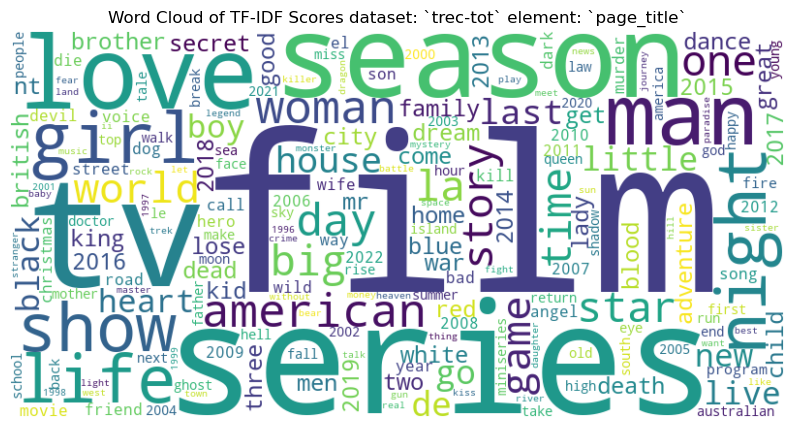

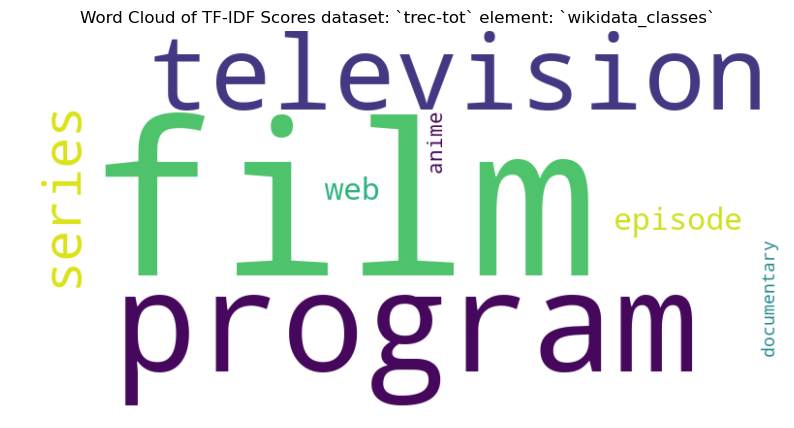

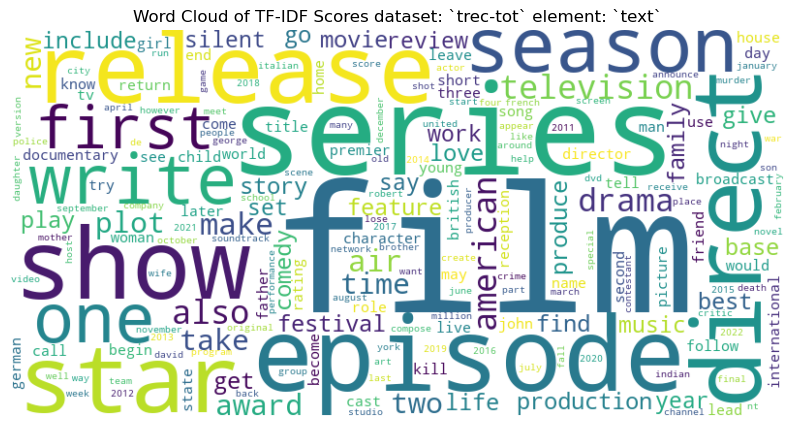

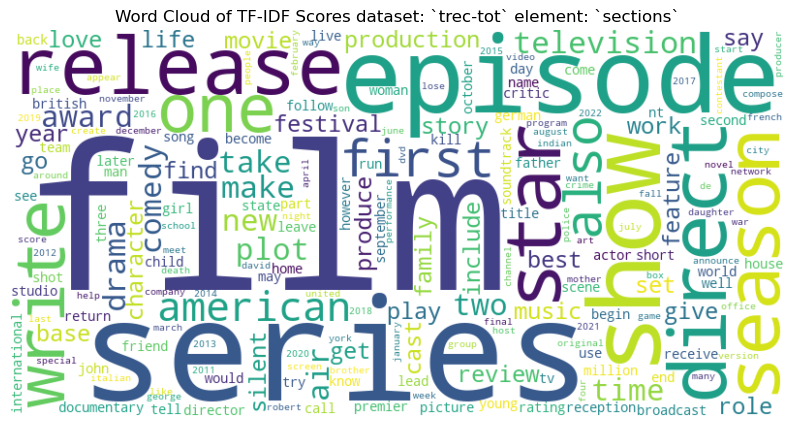

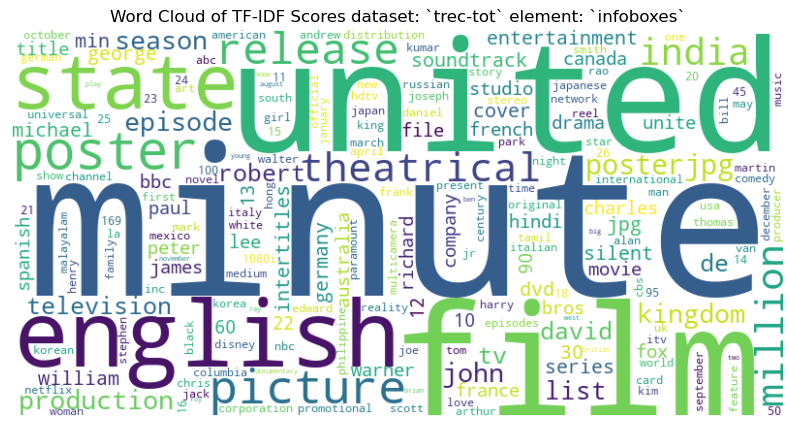

In [19]:
document_service = DocumentService(db)
model_service = ModelService(model_directory='./models')
search_engine = SearchEngine(preprocessor, spell_corrector, document_service, model_service)
elements = document_service.get_columns("trec-tot")
search_engine.load_model("trec-tot")
for element in elements:  
    if element == "doc_id":
        continue
    tfidf_matrix = search_engine.tfidf_matrices[element]
    feature_names = search_engine.vectorizers[element].vectorizer.get_feature_names_out()
    word_scores = dict(zip(feature_names, np.array(tfidf_matrix.sum(axis=0)).flatten()))    
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_scores)
    plt.figure(figsize=(10, 8))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud of TF-IDF Scores dataset: `trec-tot` element: `{element}`')
    plt.show()

#### webis-touche dataset

In [ ]:
# elements = document_service.get_columns("webis-touche")
# search_engine.load_model("webis-touche")
# for element in elements:  
#     tfidf_matrix = search_engine.tfidf_matrices[element]
#     feature_names = search_engine.vectorizers[element].vectorizer.get_feature_names_out()
#     word_scores = dict(zip(feature_names, np.array(tfidf_matrix.sum(axis=0)).flatten()))    
#     wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_scores)
#     plt.figure(figsize=(10, 8))
#     plt.imshow(wordcloud, interpolation='bilinear')
#     plt.axis('off')
#     plt.title(f'Word Cloud of TF-IDF Scores dataset: `webis-touche` element: `{element}`')
#     plt.show()

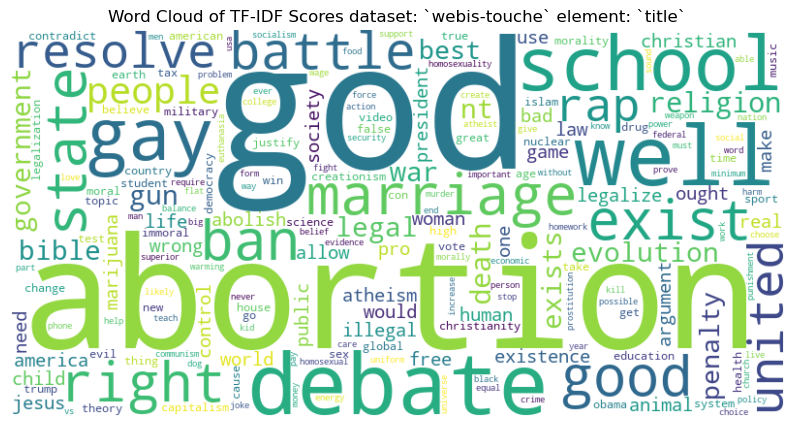

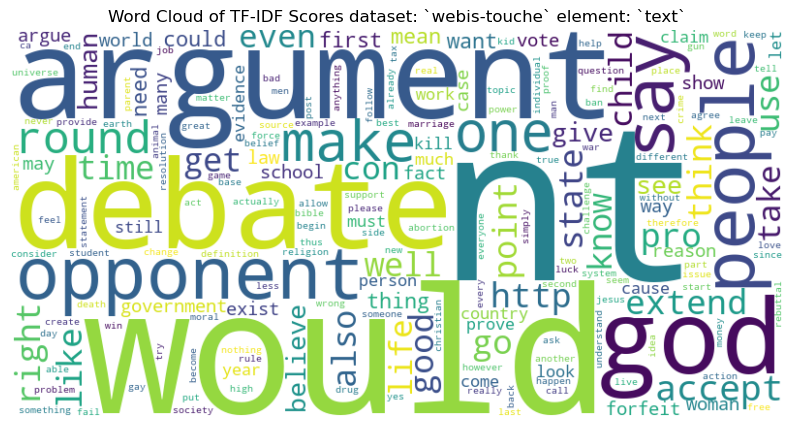

In [20]:
document_service = DocumentService(db)
model_service = ModelService(model_directory='./models')
search_engine = SearchEngine(preprocessor, spell_corrector, document_service, model_service)
elements = document_service.get_columns("webis-touche")
search_engine.load_model("webis-touche")
for element in elements:  
    if element == "doc_id":
        continue
    tfidf_matrix = search_engine.tfidf_matrices[element]
    feature_names = search_engine.vectorizers[element].vectorizer.get_feature_names_out()
    word_scores = dict(zip(feature_names, np.array(tfidf_matrix.sum(axis=0)).flatten()))    
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_scores)
    plt.figure(figsize=(10, 8))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud of TF-IDF Scores dataset: `webis-touche` element: `{element}`')
    plt.show()

## Run Flask app

In [24]:
if __name__ == '__main__':
    app.run(debug=False)

 * Serving Flask app '__main__'
 * Debug mode: off


 * Running on http://127.0.0.1:5000
Press CTRL+C to quit


dataset name was None ======================
dataset name was None ======================
get_document_count ======================
elements : ['doc_id', 'page_title', 'wikidata_classes', 'text', 'sections', 'infoboxes']
get_columns ======================


127.0.0.1 - - [04/Jun/2024 16:43:06] "GET /search?query=film&type_dataset=1 HTTP/1.1" 200 -


Final scores: [0.08931609 0.05860889 0.00411541 ... 0.         0.         0.05055368]
Ranked indices: [223405  61001 185047 ...  41567  90627 125898]
Sorted scores: [0.41138317 0.40261975 0.39963151 ... 0.         0.         0.        ]
ranked_indices: [223405  61001 185047 ...  41567  90627 125898]
docs length: 10
dataset name was None ======================


127.0.0.1 - - [04/Jun/2024 16:43:48] "GET /search?query=filmm%20foxx&type_dataset=1 HTTP/1.1" 200 -


Final scores: [0.02716829 0.0176032  0.03012054 ... 0.         0.         0.01485975]
Ranked indices: [    46 148821  62642 ...  88551  88552  91730]
Sorted scores: [0.61157467 0.60454705 0.58381377 ... 0.         0.         0.        ]
ranked_indices: [    46 148821  62642 ...  88551  88552  91730]
docs length: 10
dataset name was None ======================


127.0.0.1 - - [04/Jun/2024 16:59:19] "GET /search?query=1980&type_dataset=1 HTTP/1.1" 200 -


Final scores: [0. 0. 0. ... 0. 0. 0.]
Ranked indices: [ 24269 208813  74537 ... 154316 154315      0]
Sorted scores: [0.44911937 0.41567355 0.41024754 ... 0.         0.         0.        ]
ranked_indices: [ 24269 208813  74537 ... 154316 154315      0]
docs length: 10
dataset name was None ======================


127.0.0.1 - - [04/Jun/2024 17:00:47] "GET /search?query=day%20film&type_dataset=1 HTTP/1.1" 200 -


Final scores: [0.04113364 0.0360855  0.01222797 ... 0.         0.         0.02365818]
Ranked indices: [141486 180646 216224 ... 213712  57330  88821]
Sorted scores: [0.42882186 0.42084811 0.41454455 ... 0.         0.         0.        ]
ranked_indices: [141486 180646 216224 ... 213712  57330  88821]
docs length: 10
dataset name was None ======================


127.0.0.1 - - [04/Jun/2024 17:01:34] "GET /search?query=family%20film&type_dataset=1 HTTP/1.1" 200 -


Final scores: [0.03806228 0.02652137 0.00566403 ... 0.         0.         0.0217724 ]
Ranked indices: [178436   1446 142509 ... 125027 125026 123837]
Sorted scores: [0.50068171 0.4352476  0.4194558  ... 0.         0.         0.        ]
ranked_indices: [178436   1446 142509 ... 125027 125026 123837]
docs length: 10
dataset name was None ======================
get_document_count ======================
elements : ['doc_id', 'title', 'text']
get_columns ======================


127.0.0.1 - - [04/Jun/2024 17:18:29] "GET /search?query=actions&type_dataset=2 HTTP/1.1" 200 -


Final scores: [0. 0. 0. ... 0. 0. 0.]
Ranked indices: [ 96954 160129  49724 ... 251383 251384      0]
Sorted scores: [0.60764581 0.53122186 0.52896699 ... 0.         0.         0.        ]
change dataset name ======================
ranked_indices: [ 96954 160129  49724 ... 251383 251384      0]
docs length: 10
dataset name was None ======================


127.0.0.1 - - [04/Jun/2024 17:19:22] "GET /search?query=scifiy&type_dataset=2 HTTP/1.1" 200 -


Final scores: [0. 0. 0. ... 0. 0. 0.]
Ranked indices: [192137 223026 295459 ... 255031 255032      0]
Sorted scores: [0.23742073 0.18460442 0.15377993 ... 0.         0.         0.        ]
ranked_indices: [192137 223026 295459 ... 255031 255032      0]
docs length: 10
dataset name was None ======================
Token 'sciefi' has no correction. Using the original token.


127.0.0.1 - - [04/Jun/2024 17:19:44] "GET /search?query=sciefi&type_dataset=2 HTTP/1.1" 200 -


Final scores: [0. 0. 0. ... 0. 0. 0.]
Ranked indices: [382544 127516 127507 ... 255034 255035      0]
Sorted scores: [0. 0. 0. ... 0. 0. 0.]
ranked_indices: [382544 127516 127507 ... 255034 255035      0]
docs length: 10
dataset name was None ======================
get_document_count ======================
elements : ['doc_id', 'page_title', 'wikidata_classes', 'text', 'sections', 'infoboxes']
get_columns ======================


127.0.0.1 - - [04/Jun/2024 17:21:09] "GET /search?query=disscutions&type_dataset=1 HTTP/1.1" 200 -


Final scores: [0. 0. 0. ... 0. 0. 0.]
Ranked indices: [ 56229  16462  39929 ... 154552 154551      0]
Sorted scores: [0.16185495 0.15130779 0.14171905 ... 0.         0.         0.        ]
change dataset name ======================
ranked_indices: [ 56229  16462  39929 ... 154552 154551      0]
docs length: 10


# IR Evaluation

### Evaluation trec-tot

In [21]:
qrels = ir_datasets.load("trec-tot/2023/train").qrels_iter()
queries = ir_datasets.load("trec-tot/2023/train").queries_iter()

qrels_dict = {}
for qrel in qrels:
    if qrel.query_id not in qrels_dict:
        qrels_dict[qrel.query_id] = []
    qrels_dict[qrel.query_id].append((qrel.doc_id, qrel.relevance))

num_docs_to_display = 10

for query in queries:
    query_id = query.query_id
    query_text = query.text
    if query_id in qrels_dict:
        relevant_docs = qrels_dict[query_id]
        print(f"Query ID: {query_id}, Query Text: {query_text}")
        print("Relevant Documents and Relevance Scores:")
        for doc_id, relevance in relevant_docs[:num_docs_to_display]:
            print(f"  Document ID: {doc_id}, Relevance: {relevance}")
    else:
        print(f"Query ID: {query_id}, Query Text: {query_text}")
        print("No relevant documents found in qrels.")

Query ID: 763, Query Text: Very rare movie that is scifi/dystopian/experimental/surreal. It’s like Stalker meets el Topo meets Holy Mountain meets Alphaville meets Delicatessen meets Hard to be a God, like Kurosawa, Tarkovsky, and Lynch had a kid together. It was color, possibly Russian, and I don’t really remember the decade but want to say 60s or 70s, though could easily be more recent. It is VERY rare, there is only one crappy partial print of it, and that is what the youtube version is from. Lot of wide shots in a surreal wilderness, winter settings, strange bleeding saturation in some shots. Crazy costumes. Seriously one of the strangest films I’ve ever seen and my favorite films are strange/weird ones. If you’ve ever seen what you’re thinking of on a “best weird movies” or “you’ve never seen this!” list, that’s NOT it. I don’t think this film even has a cult following of ten people. It’s an actual rare gem. Have been looking through selections at 366 Weird Movies and not found it

In [22]:
# make run data
qrels = ir_datasets.load("trec-tot/2023/train").qrels_iter()
queries = ir_datasets.load("trec-tot/2023/train").queries_iter()
load_response, load_status = search_engine.load_model('trec-tot')
print(load_response)

with app.app_context():
    document_service = DocumentService(db)
    # RAM mode
    # documents = document_service.get_documents('trec-tot')
    # print("//////////////////* get_documents */////////////////////////")
    run = []
    list_cosine_similarities_fields = []
    for query in queries:
        query_id = query.query_id
        query_text = query.text
        ranked_indices, scores, corrected_query, error = search_engine.search(query_text, 'trec-tot')
        # list_cosine_similarities_fields.append(cosine_similarities_fields)
        # print(cosine_similarities_fields)
        print(error)
        print(corrected_query)
        print(ranked_indices)
        print(scores)
        
        # get each ranked_indices from data base array by array
        trec_docs = document_service.get_documents_by_indices(ranked_indices[:10], 'trec-tot')
        for i in range(1, 11):
            run.append(ir_measures.ScoredDoc(query_id, str(trec_docs[i-1]['doc_id']), scores[i-1]))
        
        # get get each ranked_indices from documents in RAM
        # for i, index in enumerate(ranked_indices[:10]):
        #     print(f"index: {index}")
        #     print(f"i: {i}")
        #     run.append(ir_measures.ScoredDoc(query_id, str(documents[index]['doc_id']), scores[i]))

        print(run)
        print("---------------------------------------------------")

{'message': 'trec-tot vectorizers and tf-idf matrices loaded successfully'}
dataset name was None ======================
query :Very rare movie that is scifi/dystopian/experimental/surreal. It’s like Stalker meets el Topo meets Holy Mountain meets Alphaville meets Delicatessen meets Hard to be a God, like Kurosawa, Tarkovsky, and Lynch had a kid together. It was color, possibly Russian, and I don’t really remember the decade but want to say 60s or 70s, though could easily be more recent. It is VERY rare, there is only one crappy partial print of it, and that is what the youtube version is from. Lot of wide shots in a surreal wilderness, winter settings, strange bleeding saturation in some shots. Crazy costumes. Seriously one of the strangest films I’ve ever seen and my favorite films are strange/weird ones. If you’ve ever seen what you’re thinking of on a “best weird movies” or “you’ve never seen this!” list, that’s NOT it. I don’t think this film even has a cult following of ten peopl

In [55]:
print(len(list_cosine_similarities_fields))
print(list_cosine_similarities_fields[4])

150
{'page_title': array([0., 0., 0., ..., 0., 0., 0.]), 'wikidata_classes': array([0., 0., 0., ..., 0., 0., 0.]), 'text': array([0.0136271 , 0.03495686, 0.01873337, ..., 0.01542993, 0.        ,
       0.00359676]), 'sections': array([0.01806217, 0.03531024, 0.01591081, ..., 0.01542545, 0.        ,
       0.00359608]), 'infoboxes': array([0., 0., 0., ..., 0., 0., 0.])}


In [30]:
try:
    with open("./list_cosine_similarities_fields_trec-tot.pkl", 'wb') as file:
        joblib.dump(list_cosine_similarities_fields, file)
    print(f'list_cosine_similarities_fields_trec-tot.pkl saved successfully')
except ValueError as e:
    print(f'list_cosine_similarities_fields_trec-tot.pkl could not be saved:', e)

list_cosine_similarities_fields_trec-tot.pkl saved successfully


In [98]:
try:
    with open("./list_cosine_similarities_fields_trec-tot.pkl", 'rb') as file:
        list_cosine_similarities_fields_new = joblib.load(file)
except ValueError as e:
    print(f'list_cosine_similarities_fields_trec-tot.pkl could not be saved:', e)

In [99]:
print(len(list_cosine_similarities_fields_new))
print(list_cosine_similarities_fields_new[4])

150
{'page_title': array([0., 0., 0., ..., 0., 0., 0.]), 'wikidata_classes': array([0., 0., 0., ..., 0., 0., 0.]), 'text': array([0.0136271 , 0.03495686, 0.01873337, ..., 0.01542993, 0.        ,
       0.00359676]), 'sections': array([0.01806217, 0.03531024, 0.01591081, ..., 0.01542545, 0.        ,
       0.00359608]), 'infoboxes': array([0., 0., 0., ..., 0., 0., 0.])}


In [ ]:
print(len(run))
print(run[4])

In [35]:
import json
with open('run_data_trec-tot.json', 'w') as f:
        json.dump(run, f)

In [59]:
with open('run_data_trec-tot.json', 'r') as f:
    run = json.load(f)

In [60]:
print(len(run))
print(run[4])

1500
['763', '9334661', 0.042716613984499795]


In [39]:
# qrels = ir_datasets.load("trec-tot/2023/train").qrels_iter()
# new_run = []
# for qrel in qrels:
#     for score_doc in run:
#         if qrel.query_id == score_doc.query_id:
#             new_run.append(ir_measures.ScoredDoc(score_doc.query_id, qrel.doc_id, score_doc.score))
#             break


In [40]:
# qrels = ir_datasets.load("trec-tot/2023/train").qrels_iter()

# print(new_run)
# print(len(new_run))
# l = list(qrels)
# print(l)
# print(len(l))

[ScoredDoc(query_id='763', doc_id='16742289', score=0.3048178405055476), ScoredDoc(query_id='802', doc_id='30523669', score=0.006057486853427599), ScoredDoc(query_id='950', doc_id='1705452', score=0.002290217768254204), ScoredDoc(query_id='220', doc_id='4891218', score=0.0015740793917736655), ScoredDoc(query_id='792', doc_id='4815950', score=0.003102974731420514), ScoredDoc(query_id='903', doc_id='7668946', score=0.0031659554637257573), ScoredDoc(query_id='320', doc_id='1135295', score=0.0009923421321258613), ScoredDoc(query_id='731', doc_id='43465238', score=0.0020939157629703605), ScoredDoc(query_id='882', doc_id='5638157', score=0.0006355198725182837), ScoredDoc(query_id='293', doc_id='142456', score=0.007341094212472899), ScoredDoc(query_id='525', doc_id='30296521', score=0.0), ScoredDoc(query_id='155', doc_id='22802944', score=0.0), ScoredDoc(query_id='1014', doc_id='46264411', score=0.0009570176361445948), ScoredDoc(query_id='784', doc_id='1871096', score=0.0016625507173639235), 

In [101]:
try:
    with open("./list_cosine_similarities_fields_trec-tot.pkl", 'rb') as file:
        list_cosine_similarities_fields_new = joblib.load(file)
except ValueError as e:
    print(f'list_cosine_similarities_fields_trec-tot.pkl could not be saved:', e)

qrels = ir_datasets.load("trec-tot/2023/train").qrels_iter()
queries = ir_datasets.load("trec-tot/2023/train").queries_iter()
load_response, load_status = search_engine.load_model('trec-tot')
print(load_response)
with app.app_context():
    document_service = DocumentService(db)
    elements = document_service.get_columns("trec-tot")
    document_count = document_service.get_document_count("trec-tot")
    scores = np.zeros(document_count)
    weights = [0.0, 0.7, 0.0, 1.7, 0.1, 0.4]
    # weights = [0.0, 0.0, 1.0]
    run2 = []
    for i, query in enumerate(queries):
        query_id = query.query_id
        query_text = query.text
        for element, weight in zip(elements, weights):
            if element == "doc_id":
                continue
            scores += weight * list_cosine_similarities_fields_new[i][element] 
        ranked_indices = np.argsort(scores)[::-1]
        sorted_scores = scores[ranked_indices]
        trec_docs = document_service.get_documents_by_indices(ranked_indices[:10], 'trec-tot')
        for k in range(1, 11):
            run2.append(ir_measures.ScoredDoc(query_id, str(trec_docs[k-1]['doc_id']), sorted_scores[k-1]))

{'message': 'trec-tot vectorizers and tf-idf matrices loaded successfully'}


In [102]:
print(run2)

[ScoredDoc(query_id='763', doc_id='285923', score=0.46627798967945683), ScoredDoc(query_id='763', doc_id='3757903', score=0.44375788100544045), ScoredDoc(query_id='763', doc_id='27370173', score=0.44207018879792137), ScoredDoc(query_id='763', doc_id='29012443', score=0.4318061587530145), ScoredDoc(query_id='763', doc_id='30865203', score=0.41126946289441424), ScoredDoc(query_id='763', doc_id='43526683', score=0.39689953668962946), ScoredDoc(query_id='763', doc_id='47257565', score=0.3921612938301037), ScoredDoc(query_id='763', doc_id='55024998', score=0.38901064579667066), ScoredDoc(query_id='763', doc_id='58466884', score=0.3864510869684266), ScoredDoc(query_id='763', doc_id='72039033', score=0.386422217999408), ScoredDoc(query_id='802', doc_id='74966', score=0.5664154761936167), ScoredDoc(query_id='802', doc_id='3095001', score=0.5555766435191415), ScoredDoc(query_id='802', doc_id='9215831', score=0.5089808171487797), ScoredDoc(query_id='802', doc_id='11320770', score=0.4997556047372

In [ ]:
qrels = ir_datasets.load("trec-tot/2023/train").qrels_iter()
for qrel in qrels :
    print(qrel)

In [103]:
from ir_measures import AP, R, RR, P
qrels = ir_datasets.load("trec-tot/2023/train").qrels_iter()

metrics = [R@10, P@10, RR@10, AP@10]

evaluator = ir_measures.evaluator(metrics, qrels)
evaluator.calc_aggregate(run2)


{R@10: 0.0, AP@10: 0.0, P@10: 0.0, RR@10: 0.0}

In [ ]:
# new_run = []
# print(run)
# for list in run:
#     new_run.append(ir_measures.ScoredDoc(list[0], list[1], list[2]))

# print(new_run)


[ScoredDoc(query_id='763', doc_id='23889556', score=0.0), ScoredDoc(query_id='763', doc_id='23894696', score=0.0), ScoredDoc(query_id='763', doc_id='23894804', score=0.0), ScoredDoc(query_id='763', doc_id='23895365', score=0.0), ScoredDoc(query_id='763', doc_id='23895529', score=0.0), ScoredDoc(query_id='763', doc_id='23895545', score=0.0), ScoredDoc(query_id='763', doc_id='23896772', score=0.0), ScoredDoc(query_id='763', doc_id='23897380', score=0.0), ScoredDoc(query_id='763', doc_id='23897447', score=0.0), ScoredDoc(query_id='763', doc_id='72634189', score=0.0), ScoredDoc(query_id='802', doc_id='23889556', score=0.0), ScoredDoc(query_id='802', doc_id='23894696', score=0.0), ScoredDoc(query_id='802', doc_id='23894804', score=0.0), ScoredDoc(query_id='802', doc_id='23895365', score=0.0), ScoredDoc(query_id='802', doc_id='23895529', score=0.0), ScoredDoc(query_id='802', doc_id='23895545', score=0.0), ScoredDoc(query_id='802', doc_id='23896772', score=0.0), ScoredDoc(query_id='802', doc_

### Evaluation webis-touche

In [84]:
qrels = ir_datasets.load("beir/webis-touche2020").qrels_iter()
queries = ir_datasets.load("beir/webis-touche2020").queries_iter()

qrels_dict = {}
for qrel in qrels:
    if qrel.query_id not in qrels_dict:
        qrels_dict[qrel.query_id] = []
    qrels_dict[qrel.query_id].append((qrel.doc_id, qrel.relevance))

num_docs_to_display = 10

for query in queries:
    query_id = query.query_id
    query_text = query.text
    if query_id in qrels_dict:
        relevant_docs = qrels_dict[query_id]
        print(f"Query ID: {query_id}, Query Text: {query_text}")
        print("Relevant Documents and Relevance Scores:")
        for doc_id, relevance in relevant_docs[:num_docs_to_display]:
            print(f"  Document ID: {doc_id}, Relevance: {relevance}")
    else:
        print(f"Query ID: {query_id}, Query Text: {query_text}")
        print("No relevant documents found in qrels.")

Query ID: 1, Query Text: Should teachers get tenure?
Relevant Documents and Relevance Scores:
  Document ID: 197beaca-2019-04-18T11:28:59Z-00001-000, Relevance: 4
  Document ID: 1a76ed9f-2019-04-18T16:07:27Z-00001-000, Relevance: 5
  Document ID: 1a76ed9f-2019-04-18T16:07:27Z-00002-000, Relevance: 3
  Document ID: 1a76ed9f-2019-04-18T16:07:27Z-00005-000, Relevance: 4
  Document ID: 1b03f390-2019-04-18T18:42:36Z-00003-000, Relevance: 3
  Document ID: 1b03f390-2019-04-18T18:42:36Z-00004-000, Relevance: 3
  Document ID: 1b03f390-2019-04-18T18:42:36Z-00007-000, Relevance: 5
  Document ID: 1b03f390-2019-04-18T18:42:36Z-00009-000, Relevance: 5
  Document ID: 2345fbf4-2019-04-18T14:09:46Z-00004-000, Relevance: 4
  Document ID: 24e47090-2019-04-18T19:22:46Z-00003-000, Relevance: 3
Query ID: 2, Query Text: Is vaping with e-cigarettes safe?
Relevant Documents and Relevance Scores:
  Document ID: 18710bc8-2019-04-18T16:37:00Z-00000-000, Relevance: 3
  Document ID: 18710bc8-2019-04-18T16:37:00Z-00

[INFO] [starting] opening zip file
[INFO] [finished] opening zip file s]


In [ ]:
# make run data
qrels = ir_datasets.load("beir/webis-touche2020").qrels_iter()
queries = ir_datasets.load("beir/webis-touche2020").queries_iter()
load_response, load_status = search_engine.load_model('webis-touche')
print(load_response)

with app.app_context():
    document_service = DocumentService(db)
    # RAM mode
    # documents = document_service.get_documents('trec-tot')
    # print("//////////////////* get_documents */////////////////////////")
    run = []
    list_cosine_similarities_fields = []
    for query in queries:
        query_id = query.query_id
        query_text = query.text
        ranked_indices, scores, corrected_query, error, cosine_similarities_fields = search_engine.search(query_text, 'webis-touche')
        list_cosine_similarities_fields.append(cosine_similarities_fields)
        # print(cosine_similarities_fields)
        print(error)
        print(corrected_query)
        print(ranked_indices)
        print(scores)
        # get each ranked_indices from data base array by array
        trec_docs = document_service.get_documents_by_indices(ranked_indices[:10], 'webis-touche')
        # if ranked_indices.size == 0 or len(trec_docs) < 10:
        #     continue
        for i in range(1, 11):
            run.append(ir_measures.ScoredDoc(query_id, trec_docs[i-1]['doc_id'], scores[i-1]))
        
        # get get each ranked_indices from documents in RAM
        # for i, index in enumerate(ranked_indices[:10]):
        #     print(f"index: {index}")
        #     print(f"i: {i}")
        #     run.append(ir_measures.ScoredDoc(query_id, str(documents[index]['doc_id']), scores[i]))

        print(run)
        print("---------------------------------------------------")

In [101]:
print(len(list_cosine_similarities_fields))
print(list_cosine_similarities_fields[4])

49
{'page_title': None, 'wikidata_classes': None, 'text': array([0., 0., 0., ..., 0., 0., 0.]), 'sections': None, 'infoboxes': None, 'title': array([0., 0., 0., ..., 0., 0., 0.])}


In [102]:
try:
    with open("./list_cosine_similarities_fields_webis-touche.pkl", 'wb') as file:
        joblib.dump(list_cosine_similarities_fields, file)
    print(f'list_cosine_similarities_fields_webis-touche.pkl saved successfully')
except ValueError as e:
    print(f'list_cosine_similarities_fields_webis-touche.pkl could not be saved:', e)

list_cosine_similarities_fields_webis-touche.pkl saved successfully


In [194]:
try:
    with open("./list_cosine_similarities_fields_webis-touche.pkl", 'rb') as file:
        list_cosine_similarities_fields_new = joblib.load(file)
except ValueError as e:
    print(f'list_cosine_similarities_fields_webis-touche.pkl could not be saved:', e)

In [105]:
print(len(list_cosine_similarities_fields_new))
print(list_cosine_similarities_fields_new[4])

49
{'page_title': None, 'wikidata_classes': None, 'text': array([0., 0., 0., ..., 0., 0., 0.]), 'sections': None, 'infoboxes': None, 'title': array([0., 0., 0., ..., 0., 0., 0.])}


In [105]:
print(len(run))
print(run[4])

490
ScoredDoc(query_id='1', doc_id='c065954f-2019-04-18T14:32:52Z-00004-000', score=0.0)


In [107]:
import json
with open('run_data_webis-touche.json', 'w') as f:
        json.dump(run, f)

In [108]:
with open('run_data_webis-touche.json', 'r') as f:
    run = json.load(f)

In [ ]:
print(len(run))
print(run[4])

In [195]:
try:
    with open("./list_cosine_similarities_fields_webis-touche.pkl", 'rb') as file:
        list_cosine_similarities_fields_new = joblib.load(file)
except ValueError as e:
    print(f'list_cosine_similarities_fields_webis-touche.pkl could not be saved:', e)

qrels = ir_datasets.load("beir/webis-touche2020").qrels_iter()
queries = ir_datasets.load("beir/webis-touche2020").queries_iter()
load_response, load_status = search_engine.load_model('webis-touche')
print(load_response)
with app.app_context():
    document_service = DocumentService(db)
    elements = document_service.get_columns("webis-touche")
    document_count = document_service.get_document_count("webis-touche")
    scores = np.zeros(document_count)
    weights = [0.0, 0.5, 0.3]
    run2 = []
    for i, query in enumerate(queries):
        query_id = query.query_id
        query_text = query.text
        for element, weight in zip(elements, weights):
            if element == "doc_id":
                continue
            scores += weight * list_cosine_similarities_fields_new[i][element] 
        ranked_indices = np.argsort(scores)[::-1]
        sorted_scores = scores[ranked_indices]
        trec_docs = document_service.get_documents_by_indices(ranked_indices[:10], 'webis-touche')
        for k in range(1, 11):
            run2.append(ir_measures.ScoredDoc(query_id, str(trec_docs[k-1]['doc_id']), sorted_scores[k-1]))

{'message': 'webis-touche vectorizers and tf-idf matrices loaded successfully'}


In [196]:
print(run2)

[ScoredDoc(query_id='1', doc_id='38230279-2019-04-18T19:45:44Z-00006-000', score=0.7120099224986655), ScoredDoc(query_id='1', doc_id='c065954f-2019-04-18T14:32:52Z-00000-000', score=0.7001618793146644), ScoredDoc(query_id='1', doc_id='c065954f-2019-04-18T14:32:52Z-00001-000', score=0.6974035075188589), ScoredDoc(query_id='1', doc_id='c065954f-2019-04-18T14:32:52Z-00002-000', score=0.6914008061502637), ScoredDoc(query_id='1', doc_id='c065954f-2019-04-18T14:32:52Z-00004-000', score=0.6781636865558236), ScoredDoc(query_id='1', doc_id='51530f3f-2019-04-18T18:15:02Z-00003-000', score=0.6549209708332249), ScoredDoc(query_id='1', doc_id='2944a6f1-2019-04-18T20:01:00Z-00005-000', score=0.6122068617242702), ScoredDoc(query_id='1', doc_id='3e8e72cf-2019-04-18T15:54:16Z-00002-000', score=0.5831377873350153), ScoredDoc(query_id='1', doc_id='b0680508-2019-04-18T13:48:51Z-00002-000', score=0.5507223313685935), ScoredDoc(query_id='1', doc_id='b0680508-2019-04-18T13:48:51Z-00003-000', score=0.52976434

In [130]:
qrels = ir_datasets.load("beir/webis-touche2020").qrels_iter()
for qrel in qrels :
    print(qrel)

TrecQrel(query_id='1', doc_id='197beaca-2019-04-18T11:28:59Z-00001-000', relevance=4, iteration='0')
TrecQrel(query_id='1', doc_id='1a76ed9f-2019-04-18T16:07:27Z-00001-000', relevance=5, iteration='0')
TrecQrel(query_id='1', doc_id='1a76ed9f-2019-04-18T16:07:27Z-00002-000', relevance=3, iteration='0')
TrecQrel(query_id='1', doc_id='1a76ed9f-2019-04-18T16:07:27Z-00005-000', relevance=4, iteration='0')
TrecQrel(query_id='1', doc_id='1b03f390-2019-04-18T18:42:36Z-00003-000', relevance=3, iteration='0')
TrecQrel(query_id='1', doc_id='1b03f390-2019-04-18T18:42:36Z-00004-000', relevance=3, iteration='0')
TrecQrel(query_id='1', doc_id='1b03f390-2019-04-18T18:42:36Z-00007-000', relevance=5, iteration='0')
TrecQrel(query_id='1', doc_id='1b03f390-2019-04-18T18:42:36Z-00009-000', relevance=5, iteration='0')
TrecQrel(query_id='1', doc_id='2345fbf4-2019-04-18T14:09:46Z-00004-000', relevance=4, iteration='0')
TrecQrel(query_id='1', doc_id='24e47090-2019-04-18T19:22:46Z-00003-000', relevance=3, itera

In [197]:
from ir_measures import AP, R, RR, P
qrels = ir_datasets.load("beir/webis-touche2020").qrels_iter()

metrics = [R@10, P@10, RR@10, AP@10]

evaluator = ir_measures.evaluator(metrics, qrels)
evaluator.calc_aggregate(run2)

{R@10: 0.004678416821273964,
 AP@10: 0.002737803202088916,
 P@10: 0.022448979591836737,
 RR@10: 0.026360544217687073}

# Information Retrieval Search Engine

This repository contains the code for a simple search engine built using [Backend Framework, Flask] for the backend and Flutter for the frontend. The search engine is designed to work with two datasets: TREC Total Recall Track (TREC-TOT) and Webis-Touche-2020.

## Table of Contents

- [Project Overview](#project-overview)
- [Features](#features)
- [Datasets Used](#datasets-used)
- [System Architecture](#system-architecture)
- [Getting Started](#getting-started)
    - [Prerequisites](#prerequisites)
    - [Installation](#installation)
    - [Running the Application](#running-the-application)
- [Project Structure](#project-structure)
- [Evaluation](#evaluation)
- [Future Work](#future-work)
- [Team Members and Contributions](#team-members-and-contributions)
- [References](#references)

## Project Overview

This project implements a simple search engine designed to retrieve information from two distinct datasets: TREC Total Recall Track (TREC-TOT) and Webis-Touche-2020. The engine leverages fundamental Information Retrieval (IR) techniques, including text preprocessing, TF-IDF weighting, and cosine similarity, to facilitate effective document retrieval.

The backend of the search engine is powered by Flask, a Python web framework, while the frontend is developed using Flutter, providing a cross-platform user interface. The system is architected using a Service-Oriented Architecture (SOA) to ensure modularity and maintainability.

## Features

- Search functionality for two different datasets.
- Preprocessing of text data (tokenization, stemming, stop word removal).
- Spell correction for user queries.
- TF-IDF model for document indexing and retrieval.
- User-friendly interface built with Flutter.

## Datasets Used

1. **TREC Total Recall Track (TREC-TOT):** [Provide a link to the dataset]
    - Description: This dataset comprises a large collection of Wikipedia documents, focusing on retrieving all relevant documents for a given topic. Each document includes attributes like title, Wikidata classes, text content, sections, and infoboxes.

    - Example Document:
        ```
        TipOfTheTongueDoc(doc_id='330', page_title='Actrius', wikidata_id='Q2823770', 
        wikidata_classes=[['Q11424', 'film']], text='Actresses (Catalan: Actrius) is a 1997 ...')
        ```





2. **Webis-Touche-2020:** [Provide a link to the dataset]
    - Description: This dataset consists of posts from the Debate.org platform, an online debating forum. Each document includes the post's text, the debate topic's title, and the author's stance (pro or con) on the topic.

    - Example Document:
        ```
        BeirToucheDoc(doc_id='c67482ba-2019-04-18T13:32:05Z-00000-000', 
        text='My opponent forfeited every round. None of my arguments were answered. ...', 
        title='Contraceptive Forms for High School Students', stance='CON', 
        url='https://www.debate.org/debates/Contraceptive-Forms-for-High-School-Students/1/')
        ```

## System Architecture

This project follows a Service-Oriented Architecture (SOA) approach. The system is divided into independent and reusable services:

- **Preprocessor Service:** Cleans and preprocesses text data.
- **Spell Corrector Service:** Corrects spelling errors in user queries.
- **Document Service:** Manages the storage and retrieval of documents from the database.
- **Model Service:** Handles the saving and loading of TF-IDF models.
- **Search Engine:** Orchestrates the other services to perform the search operation.

**Communication between Services:**

- Services communicate through well-defined APIs.
- The system uses the Flask framework to create RESTful APIs.

**System Architecture Diagram:**

``` mermaid
graph LR
    subgraph Frontend using Flutter
        A[User Interface]
    end
    subgraph Backend in Python
        B[API Endpoints using Flask]
        C[Search Engine]
        D[Preprocessor Service]
        E[Spell Corrector Service]
        F[Document Service]
        G[Model Service]
        H[Database using MySQL] 
    end
    A --> B
    B --> C
    C --> D
    C --> E
    C --> F
    C --> G
    F --> H
    G --> H
```


## Getting Started

### Prerequisites

**For the Backend:**

- **Python 3.7+:**  [https://www.python.org/downloads/](https://www.python.org/downloads/) 
- **pip:** (Usually installed with Python) - Used to install Python packages.
- **virtualenv (Recommended):**  [https://virtualenv.pypa.io/en/latest/](https://virtualenv.pypa.io/en/latest/) - To create a virtual environment and manage dependencies separately for this project.
- **MySQL Server:** [https://www.mysql.com/](https://www.mysql.com/) - You'll need a running MySQL server to store your document data.
- **MySQL Client:** You'll need a way to connect to and interact with your MySQL server (often included with MySQL Server installation, or you can use tools like MySQL Workbench).

**For the Frontend:**

- **Flutter SDK:** [https://flutter.dev/docs/get-started/install](https://flutter.dev/docs/get-started/install) - Follow the instructions for your operating system.
- **Android Studio or VS Code:** (Or any other Flutter-supported IDE) - For developing and running the Flutter app.
- **Android Emulator or Device / iOS Simulator or Device:** To run and test your Flutter app.

**Other (Potentially Needed):**

- **Git:** [https://git-scm.com/](https://git-scm.com/) - For cloning the repository (if you're using one).
- **Text Editor:** (Like VS Code, Sublime Text, Atom) - For working with the code.

**Python Libraries (Installed via pip):**
```bash
pip install Flask Flask-SQLAlchemy nltk scikit-learn spellchecker mwparserfromhell joblib pandas matplotlib wordcloud ir_datasets ir_measures
```

- **Flask:** Web framework for the backend.
- **Flask-SQLAlchemy:** Easier database interactions with Flask.
- **NLTK:** Natural Language Toolkit for text processing (tokenization, stemming, stop words).
    - **Download NLTK Data:** After installing `nltk`, run these commands in a Python environment:
        ```python
        import nltk
        nltk.download('punkt')
        nltk.download('stopwords')
        nltk.download('wordnet') 
        ```
- **scikit-learn:** Machine learning library (used for TF-IDF and cosine similarity).
- **spellchecker:** For spell correction.
- **mwparserfromhell:** Parses MediaWiki markup (likely for cleaning Wikipedia data).
- **joblib:** Saves and loads Python objects (like machine learning models).
- **pandas:** Data manipulation and analysis using DataFrames.
- **matplotlib:** Creates visualizations (plots, graphs).
- **wordcloud:** Generates word clouds.
- **ir_datasets:** Loads information retrieval datasets (like TREC-TOT).
- **ir_measures:** Evaluates information retrieval systems.


**Flutter Packages (Installed via pubspec.yaml):**

- **http:** `dependencies: http: ^1.2.1` (or latest version) - For making API requests to the backend.

### Installation

1. Clone the repository: `git clone https://github.com/YasserBar/IR-Search-Engine.git`
2. Navigate to the project directory: `cd IR-Search-Engine`
3. Install backend dependencies: `pip install -r requirements.txt`
4. Install Flutter dependencies: `flutter pub get`
5. **Set up the database:**
   - **Make sure you have MySQL Server running.** If not, download and install it from [https://www.mysql.com/](https://www.mysql.com/) and follow the setup instructions.
   - **Create the Database:**
     - Open a MySQL client (e.g., MySQL Workbench, command line).
     - Run the following command to create the database:
       ```sql
       CREATE DATABASE ir_search_engine;
       ```
   - **Configuration:** The database connection is already configured in the `config.py` file. 

6. **[Continue with other installation steps, like running migrations if needed]**.

### Running the Application

1. Start the backend server: `python app.py` (or your equivalent command)
2. Run the Flutter app: `flutter run`

## Project Structure
IR-Search-Engine/
├── backend_simple_search_engine/ # Backend code (Flask)
│ ├── app.py # Main Flask application file
│ ├── __init__.py # initial Flask application file
│ ├── requirements.txt # Python dependencies
│ ├── services # Folder services
│ └── models # Folder where store tf-idf matrixes and vectorizers files
│
├── frontend/ # Flutter frontend code
│ ├── lib/ # Main Flutter code
│ │ ├──api_service.dart  # Connect with backend 
│ │ ├──search_screen.dart # UI
│ │ └──main.dart # Root frontend app
│ └── pubspec.yaml # Flutter dependencies
│
├── notebooks/ # Jupyter notebooks (optional)
│ ├── jubyter_notebook.ipynb
│ └── models # folder content tf-idf matrixes and vectorizers files
└── README.md # This file

## Evaluation

The performance of the search engine was evaluated using the following metrics:

- Mean Average Precision (MAP)
- Recall@10
- Precision@10
- Mean Reciprocal Rank (MRR)

**[Include a table with your evaluation results, comparing performance before and after adding a new feature (if applicable)]**

**Analysis of Results:**

[Provide a brief analysis of the evaluation results, explaining any improvements or changes observed after adding a new feature.]

## Future Work

- [List potential improvements or features you would like to add in the future]

## Team Members and Contributions

- [List team members and their contributions to the project]

## References

- [List any external resources, libraries, or datasets used in the project]












==============================================

Remember to:

Replace the placeholders (e.g., [Backend Framework], [Provide a link to the dataset]) with your actual information.

Add more details and explanations to each section as needed.

Include screenshots or diagrams to make your README more visually appealing and easier to understand.

Keep your README concise and well-organized.

